# RCES Final Project

## Seismic Swarm in the Bransfield Strait August 2020-February 2021

### Jacqueline Singer, Fall 2022

This project is based on the data and work done by [Cesca et al., 2022 Dataset](https://static-content.springer.com/esm/art%3A10.1038%2Fs43247-022-00418-5/MediaObjects/43247_2022_418_MOESM5_ESM.txt). The bathymetry data is from GeoMapApp (http://www.geomapapp.org).

### Research Question
What is the profile of the seismic swarm that occurred August 2020-February 2021 in the Bransfield Strait, Antarctica?

### Hypothesis
There will be a temporal pattern related to magnitude and focal mechanism. 

### Analysis

I will look at the distribution of the earthquakes and the locations of the events. I will also compared and analyze the events by focal mechanisms. Next, I will analyze the magnitude of the earthquakes and their depths. Finally, I will conduct a temporal analysis.

In [1]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import xarray as xr
%config InlineBackend.figure_format = 'retina'

In [2]:
import hvplot.pandas
import hvplot.xarray
import cartopy.crs as ccrs
import cartopy
import matplotlib.patches as mpatches
from matplotlib.dates import DateFormatter, date2num
from mpl_toolkits import mplot3d

## Loading Data

### Bathymetry data

In [3]:
ds = xr.open_dataset('bransfieldstrait.nc').load()

In [4]:
#fix spacing so there are even intervals

In [5]:
ds['lon'] = np.linspace(ds.x_range.values[0], ds.x_range.values[1], 2421)

In [6]:
ds['lat'] = np.linspace(ds.y_range.values[0], ds.y_range.values[1], 1204)

In [7]:
#Transpose and flip data so depth coordinates with the correct lat and lon

In [8]:
depth = np.flipud(np.flip(np.reshape(ds.z.values, (1204,2421)).transpose()))

In [9]:
#add amended z values as depth with dimensions

In [10]:
ds['depth'] = xr.DataArray(depth, dims=['lon', 'lat'])

In [11]:
#Too large to extract subset
#bath_subset = ds.where((-59.5 < ds.lon) & (ds.lon < -57) & (-62.6 < ds.lat) & (ds.lat < -61.8), drop=True)

In [12]:
ds_sub = xr.open_dataset('subset.nc').load()
ds_sub['lon'] = np.linspace(ds_sub.x_range.values[0], ds_sub.x_range.values[1], 2168)
ds_sub['lat'] = np.linspace(ds_sub.y_range.values[0], ds_sub.y_range.values[1], 1633)
depth = np.flipud(np.flip(np.reshape(ds_sub.z.values, (1633,2168)).transpose()))
ds_sub['depth'] = xr.DataArray(depth, dims=['lon', 'lat'])

### Earthquake Data

In [13]:
# sep='\s+' removes all white spaces clumped together not just one space
# skiprows=4 removes the first 4 rows
# TemplId: Identificator of the template
# MTTyp: nf = normal faulting, ss = strike-slip, na = not available
# EVTyp: T = template, D = newly detected
# MAD: median absolute deviation

In [14]:
df = pd.read_csv("https://static-content.springer.com/esm/art%3A10.1038%2Fs43247-022-00418-5/MediaObjects/43247_2022_418_MOESM5_ESM.txt", 
                 sep='\s+', skiprows=4, header=None, names=['date', 'time', 'lat', 'lon', 'depth', 'Mw', 'CC', 'MAD', 'TemplId', 'MTTyp', 'EVTyp'], parse_dates=[0])
df.head()

,date,time,lat,lon,depth,Mw,CC,MAD,TemplId,MTTyp,EVTyp
0,2020-08-01,08:01:21.493,-62.4053,-58.4021,10.9,0.69,0.405,17.321,39,ss,D
1,2020-08-01,08:43:17.795,-62.2868,-58.2250,8.7,1.06,0.450,20.911,74,nf,D
2,2020-08-01,09:25:59.834,-62.3626,-58.3286,4.2,1.10,0.484,17.308,66,nf,D
3,2020-08-01,11:28:15.682,-62.3571,-58.3527,11.0,0.16,0.478,15.825,65,ss,D
4,2020-08-01,12:43:39.631,-62.3826,-58.3742,6.8,0.36,0.477,18.811,46,nf,D


In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 85206 entries, 0 to 85205
Data columns (total 11 columns):
 #   Column   Non-Null Count  Dtype         
---  ------   --------------  -----         
 0   date     85206 non-null  datetime64[ns]
 1   time     85206 non-null  object        
 2   lat      85206 non-null  float64       
 3   lon      85206 non-null  float64       
 4   depth    85206 non-null  float64       
 5   Mw       85206 non-null  float64       
 6   CC       85206 non-null  float64       
 7   MAD      85206 non-null  float64       
 8   TemplId  85206 non-null  int64         
 9   MTTyp    85206 non-null  object        
 10  EVTyp    85206 non-null  object        
dtypes: datetime64[ns](1), float64(6), int64(1), object(3)
memory usage: 7.2+ MB


In [16]:
df.describe()

,lat,lon,depth,Mw,CC,MAD,TemplId
count,85206.000000,85206.000000,85206.000000,85206.000000,85206.000000,85206.000000,85206.000000
mean,-62.332830,-58.297493,8.921279,1.479389,0.481852,20.633588,53.978229
std,0.046404,0.096124,2.241521,0.759553,0.066630,8.192851,36.579724
min,-62.514800,-59.235400,2.900000,-0.600000,0.400000,12.042000,0.000000
25%,-62.362100,-58.348600,7.300000,0.930000,0.432000,18.269000,22.000000
50%,-62.341600,-58.293000,9.800000,1.380000,0.467000,20.181000,53.000000
75%,-62.310700,-58.252275,10.000000,1.940000,0.515000,22.479000,80.000000
max,-62.090000,-57.396500,17.500000,5.980000,1.000000,999.000000,127.000000


In [17]:
#extent = [-60.5, -57.5, -62, -62.6]

### Plotting Study Location

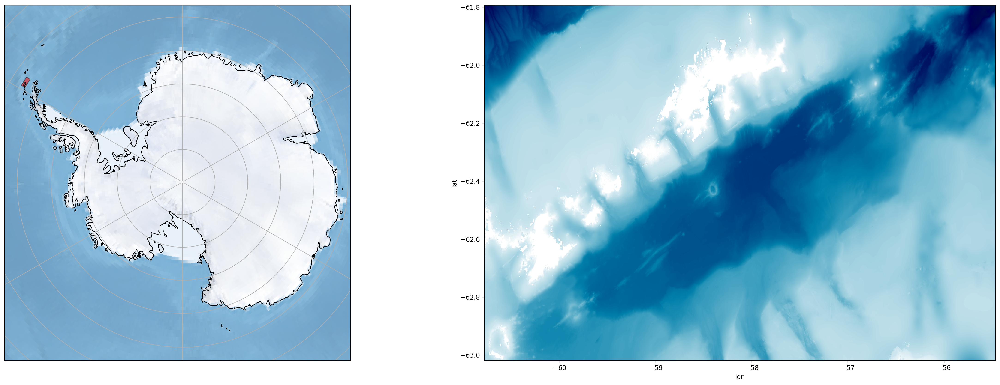

In [18]:
def main():
    fig = plt.figure(figsize=(30,10))
    ax0 = fig.add_subplot(1, 2, 1, projection=ccrs.SouthPolarStereo())
    ax1 = fig.add_subplot(1, 2, 2)
    
    #Left image
    # Limit the map to -60 degrees latitude and below.
    ax0.set_extent([-250, 50, -90, -63], ccrs.PlateCarree())

    ax0.stock_img()
    ax0.gridlines()
    ax0.coastlines(resolution='50m')
    ax0.add_patch(mpatches.Rectangle(xy=[-59, -62.3], width=3, height=.6,
                                    facecolor='red',
                                    edgecolor='k',
                                    alpha=0.5,
                                    transform=ccrs.PlateCarree()))

    #Right image
    ax1 = ds.depth.plot(x='lon', y='lat', cmap='ocean', add_colorbar=False,  vmax=300, vmin=-4000)
    fig.subplots_adjust(wspace=0.1) 
    plt.show()


if __name__ == '__main__':
    main()

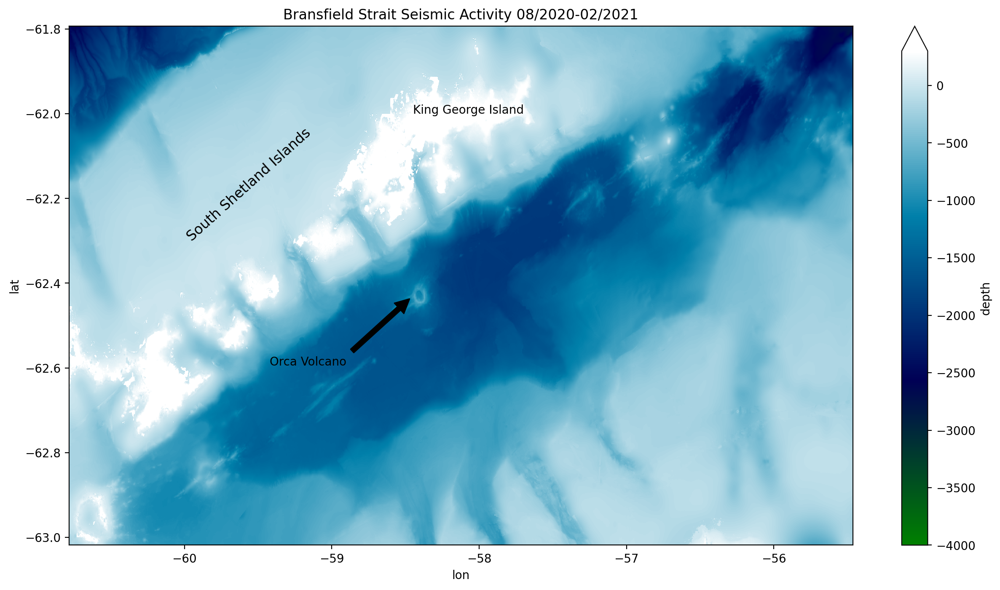

In [19]:
fig, ax = plt.subplots(figsize=(15,8))

ds.depth.plot(ax=ax, x='lon', y='lat', cmap='ocean',  vmax=300, vmin=-4000)
ax.set_title('Bransfield Strait Seismic Activity 08/2020-02/2021')

ax.text(-58.45,-62, 'King George Island', c='k', fontsize=10)

ax.text(-60,-62.3, 'South Shetland Islands', c='k', fontsize=12, rotation=42)

#ax.annotate('Orca Volcano',xy=(-58, -62.5), xycoords='data')
ax.annotate('Orca Volcano',xy=(-58.45, -62.43), xycoords='data',
            xytext=(-58.9, -62.6), textcoords='data',
            arrowprops=dict(facecolor='black', shrink=0.05),
            horizontalalignment='right', verticalalignment='bottom');

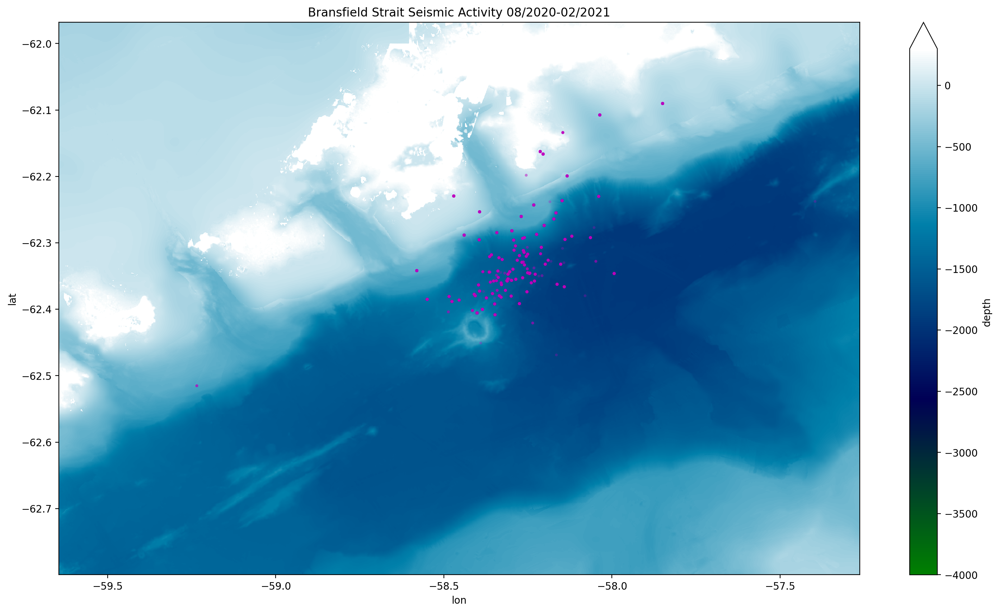

In [20]:
fig, ax = plt.subplots(figsize=(18,10))

ds_sub.depth.plot(ax=ax, x='lon', y='lat', cmap='ocean',  vmax=300, vmin=-4000)
ax.scatter(df.lon, df.lat, s=4, alpha=0.2, c='m')
ax.set_title('Bransfield Strait Seismic Activity 08/2020-02/2021');

#Clustered around seismic unrest region

### Focal Mechanism Plots

In [21]:
df_faults = df.groupby('MTTyp')

In [22]:
ss = df_faults.get_group('ss')
nf = df_faults.get_group('nf')
na = df_faults.get_group('na')

### 4 phases:
 - Phase 1: This phase is characterized by low seismicity and low magnitudes. (10-29 August)
 - Phase 2: This phase is the start of larger earthquakes with a mag of 4.5+, at this point deformation becomes visible. This is also the first phase visible to international agencies. There is a decline in activity after the October 2 M5.9 earthquake. (29 August-21 October)
 - Phase 3: A new burst of activity starts. First with a wave of strike-slips followed by normal faults. This phase ends with the largest earthquake of the cluster with a M6 (21 October-6 November)
 - Phase 4: The seimiscity and deformation drops. (6 November-1 February)

The reason for the rapid decrease in activity is believed to be due to the dike's loss in pressure which inhibits further propagation.
(Cesca et al, 2022)

The phases are visible in the hexbin plot below. Phase 2 and the start of phase 3 are characterized by more normal faulting than strike-slip. The other phases are more evenly distributed.

Text(0.5, 1.0, 'Normal Faults')

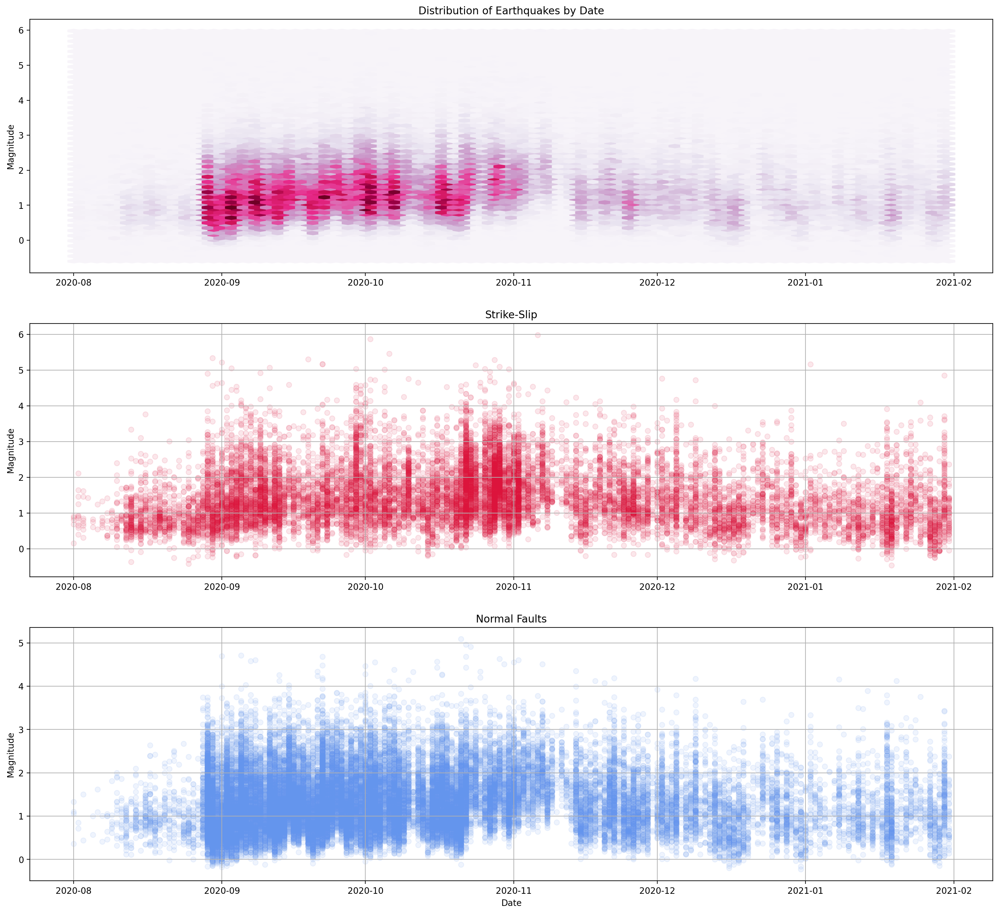

In [23]:
fig = plt.figure(figsize=(20,18))
ax0 = fig.add_subplot(311)
dates = [date2num(i.date()) for i in df.date]
ax0.hexbin(dates, df.Mw, cmap='PuRd', gridsize=(75,45))
ax0.xaxis_date()
ax0.set_ylabel('Magnitude')
ax0.set_title('Distribution of Earthquakes by Date')

ax1 = fig.add_subplot(312)
ax1.scatter(ss.date, ss.Mw, c='crimson', alpha=0.1, label='Strike Slip')
ax1.grid()
ax1.set_ylabel('Magnitude')
ax1.set_title('Strike-Slip')

ax2 = fig.add_subplot(313)
ax2.scatter(nf.date, nf.Mw, c='cornflowerblue', alpha=0.1, label='Normal Fault')
ax2.grid()
ax2.set_xlabel('Date')
ax2.set_ylabel('Magnitude')
ax2.set_title('Normal Faults')

In [24]:
df.hvplot.points('lon', 'lat', color='Mw', cmap='plasma', groupby='date', width=1300, height=600).opts(title='Daily Earthquake Locations and Magnitudes')



:DynamicMap   [date]
   :Points   [lon,lat]   (Mw)

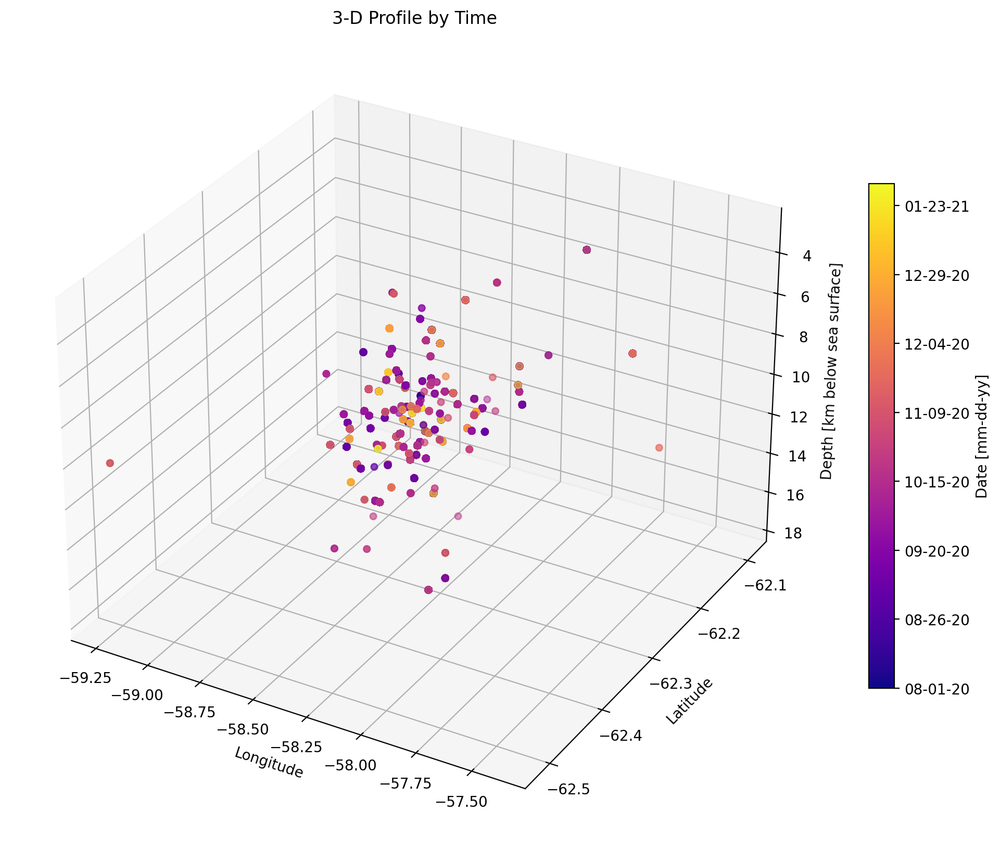

In [25]:
fig, ax = plt.subplots(subplot_kw={'projection': '3d'}, figsize=(10,10))
figure = ax.scatter(df.lon, df.lat, df.depth, c=[date2num(i.date()) for i in df.date], cmap='plasma')
cbar = fig.colorbar(figure, ax=ax, shrink=0.5, format=DateFormatter('%m-%d-%y'))
cbar.set_label('Date [mm-dd-yy]')

ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_zlabel('Depth [km below sea surface]')
ax.invert_zaxis()
ax.ticklabel_format(useOffset=False)
ax.set_title('3-D Profile by Time')
plt.tight_layout()


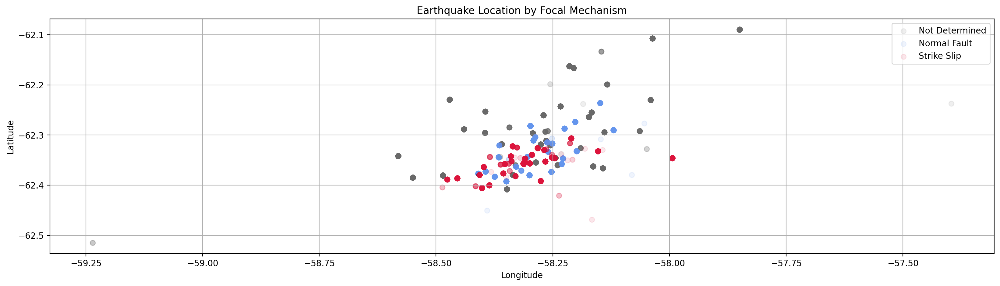

In [26]:
fig = plt.figure(figsize=(20,5))
ax = fig.add_subplot()

ax.scatter(na.lon, na.lat, c='dimgrey', alpha=0.1, label='Not Determined')
ax.scatter(nf.lon, nf.lat, c='cornflowerblue', alpha=0.1, label='Normal Fault')
ax.scatter(ss.lon, ss.lat, c='crimson', alpha=0.1, label='Strike Slip')
ax.grid()
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_title('Earthquake Location by Focal Mechanism')
ax.legend();

The plots below show the fault lines by focal mechanisms. The undetermined focal mechanisms are deeper than the other types. The normal faults are more evenly dsitributed by depth. 

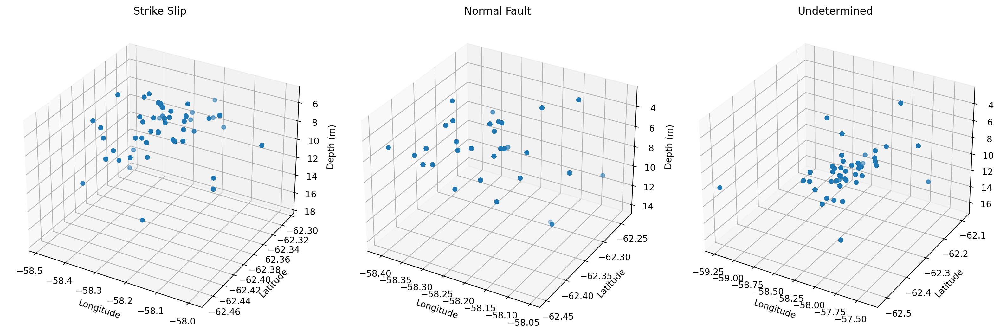

In [27]:
fig, ax = plt.subplots(ncols=3, subplot_kw={'projection': '3d'}, figsize=(20, 20))

ax[0].scatter(ss.lon, ss.lat, ss.depth)
ax[0].invert_zaxis()
ax[0].set_xlabel('Longitude')
ax[0].set_ylabel('Latitude')
ax[0].set_zlabel('Depth (m)')
ax[0].set_title('Strike Slip')

ax[1].scatter(nf.lon, nf.lat, nf.depth)
ax[1].invert_zaxis()
ax[1].set_xlabel('Longitude')
ax[1].set_ylabel('Latitude')
ax[1].set_zlabel('Depth (m)')
ax[1].set_title('Normal Fault')

ax[2].scatter(na.lon, na.lat, na.depth) 
ax[2].invert_zaxis()
ax[2].set_xlabel('Longitude')
ax[2].set_ylabel('Latitude')
ax[2].set_zlabel('Depth (m)')
ax[2].set_title('Undetermined')
fig.subplots_adjust(wspace=0.1)  ;

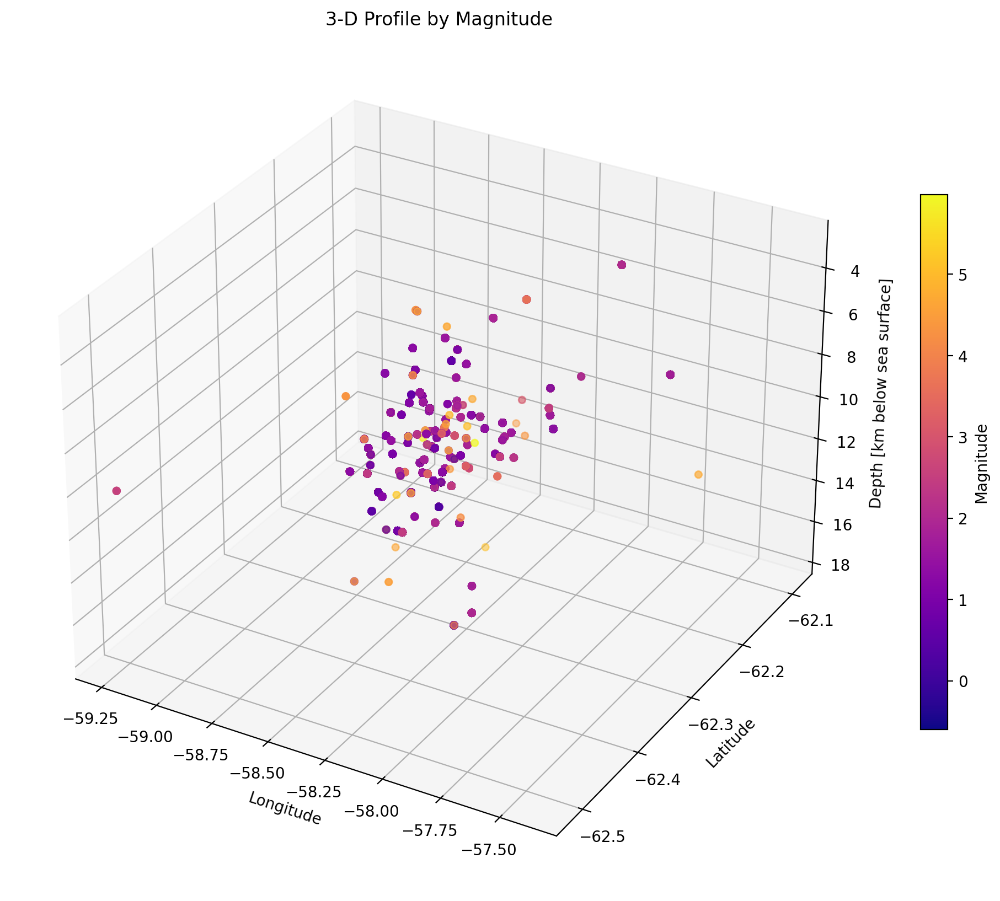

In [28]:
fig, ax = plt.subplots(subplot_kw={'projection': '3d'}, figsize=(10, 10))
figure = ax.scatter(df.lon, df.lat, df.depth, c=df.Mw, cmap='plasma')
cbar = fig.colorbar(figure, ax=ax, shrink=0.5)
cbar.set_label('Magnitude')

ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_zlabel('Depth [km below sea surface]')
ax.invert_zaxis()
ax.ticklabel_format(useOffset=False)
ax.set_title('3-D Profile by Magnitude')
plt.tight_layout()


There is no clear trend between magnitude and depth.

### Conclusions

The seismic swarm is divided into 4 phases. The most activity occurs during the middle two phases. The 3-D figures provide clear fault lines where strike-slip and normal faulting had occured. 

The future research would be to analyze the deformations of the seafloor and to assess potential causes of the increased activity. 

## References: 

Cesca, S., Sugan, M., Rudzinski, Ł, Vajedian, S., Niemz, P., Plank, S., . . . Dahm, T. (2022). Massive earthquake swarm driven by magmatic intrusion at the bransfield strait, antarctica. Communications Earth & Environment, 3(1), 1-11. doi:10.1038/s43247-022-00418-5

Ryan, W. B. F., S.M. Carbotte, J. Coplan, S. O'Hara, A. Melkonian, R. Arko, R.A. Weissel, V. Ferrini, A. Goodwillie, F. Nitsche, J. Bonczkowski, and R. Zemsky (2009), Global Multi-Resolution Topography (GMRT) synthesis data set, Geochem. Geophys. Geosyst., 10, Q03014, doi:10.1029/2008GC002332.
